In [3]:
import pandas as pd
# import requests
# from bs4 import BeautifulSoup
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
# import geopandas
# import contextily
import random
import seaborn as sns

# **Sieć komunikacji miejskiej miasta Wrocław**

**Źródła danych:**
* Dane odnośnie przystanków i czasu przejazdu: 
    * https://www.wroclaw.pl/open-data/dataset/rozkladjazdytransportupublicznegoplik_data
    * https://www.wroclaw.pl/linia-1-wroclaw (przykład dla linii 1)

**Opis danych:**
* Węzłami (wierzchołkami) są przystanki
* Połączeniami (krawędziami) są trasy pomiędzy przystankami (pojedyncza krawędź to przejazd autobusu/tramwaju z przystanku do przystanku)
* Krawędzie posiadają wagę, którą jest czas przejazdu danej linii od przystanku do przystanku

# **Pozyskiwanie danych**

In [2]:
routes = pd.read_csv("data/routes.txt")
stops = pd.read_csv("data/stops.txt")
trips = pd.read_csv("data/trips.txt")
stop_times = pd.read_csv("data/stop_times.txt")

In [3]:
# Niektóre połączenia nie miały opisów czasu trasy. W takim wypadku szukano połączeń w drugą stronę, które taki opis posiadały.
# Jeżeli wciąż nie znajdowano takich połączeń, to czas trasy losowano z przedziału [1, 3]
def fix_connections(connections):
    for connection in connections:
        time = connection['time']
        if time <= 0:
            source = connection['source']
            target = connection['target']
            for connection_2 in connections:
                source_2 = connection_2['source']
                target_2 = connection_2['target']
                time_2 = connection_2['time']
                if source_2 == target and target_2 == source and time_2 > 0:
                    connection['time'] = time_2
            if connection['time'] <= 0:
                connection['time'] = random.randint(1, 3) # Błędy w danych
        else:
            continue        
    return connections

# Scrappowanie czasu przejazdu
def find_times_row_route_direction(href):
    soup = BeautifulSoup(requests.get(href).content, "html.parser")
    table = soup.find('table', {'class': 'table table-bordered table-schedule hide-to-print'}).find('tbody')
    table_rows = table.findAll('tr')[1:]
    times = [row.findAll('td')[1].text for row in table_rows]
    times = [int(time) if len(time) > 0 else -1 for time in times]
    return times

# Scrappowanie połączeń
def get_connections(route_id):
    try:
        url = f"https://www.wroclaw.pl/linia-{str(route_id)}-wroclaw"
        page = requests.get(url)
        soup = BeautifulSoup(page.content, "html.parser")
        # find table with stops
        table = soup.find("table", {"class": "table table-bordered table-schedule"}).find("tbody")
        # find stops names in the table
        stops_names = table.findAll("a", {"class": "btn"})
        stops_names = [f"{stop.text}-{stop['href'].split('-')[-1]}" for stop in stops_names if stop.text != '']
        # find stops in specific directions
        direction_1 = [stops_names[i*2] for i in range(len(stops_names)//2)]
        direction_2 = [stops_names[i*2+1] for i in range(len(stops_names)//2)]
        # find times between stops
        dir1_href = 'https://www.wroclaw.pl' + table.find('a', {'class': 'btn btn-primary'})['href']
        dir2_href = 'https://www.wroclaw.pl' + table.find('a', {'class': 'btn btn-danger'})['href']
        dir1_times = find_times_row_route_direction(dir1_href)
        dir1_times = [time2 - time1 for time1, time2 in zip(dir1_times[:-1], dir1_times[1:])]
        dir2_times = find_times_row_route_direction(dir2_href)
        dir2_times = [time2 - time1 for time1, time2 in zip(dir2_times[:-1], dir2_times[1:])]
        # create directions stop1-stop2 for all stops
        direction_1_connections = [{'source': source, 'target': target, 'route_id': route_id, 'time': time} for source, target, time in zip(direction_1[:-1], direction_1[1:], dir1_times)]
        direction_2_connections = [{'source': source, 'target': target, 'route_id': route_id, 'time': time} for source, target, time in zip(direction_2[:-1], direction_2[1:], dir2_times)]
        # create all route connections: list of (source, target) elements
        route_connections = direction_1_connections + direction_2_connections
        route_connections = fix_connections(route_connections)
    except:
        route_connections = []
    return route_connections

In [4]:
route_ids = trips['route_id'].unique()

all_connections = []
for route_id in route_ids:
    all_connections.extend(get_connections(route_id))
    
routes_df = pd.DataFrame.from_dict(all_connections, orient='columns')
routes_df.to_csv("routes_df.csv", index=False)

In [5]:
# # Plot with geopandas
# gdf = geopandas.GeoDataFrame(stops, geometry=geopandas.points_from_xy(stops.stop_lon, stops.stop_lat), crs='EPSG:3857')
# ax = gdf.plot(markersize=1)
# contextily.add_basemap(ax, crs=gdf.crs.to_string())

# **Tworzenie grafu**

In [4]:
routes_df = pd.read_csv("routes_df.csv")
G = nx.from_pandas_edgelist(routes_df, edge_attr='time', create_using=nx.MultiDiGraph())
G2 = nx.from_pandas_edgelist(routes_df, edge_attr='time', create_using=nx.DiGraph())
G3 = nx.Graph(G)

In [ ]:
print('W sieci jest ' + str(len(list(nx.connected_components(U)))) + ' komponent(ów)')

In [7]:
n_G_edges, n_G2_edges = len(G.edges), len(G2.edges)
print(f"Przed usunięciem pętli i wielokrotnych krawędzi: {n_G_edges}")
print(f"Po usunięciu pętli i wielokrotnych krawędzi: {n_G2_edges}")
print(f"Ubyło {n_G_edges - n_G2_edges} krawędzi (pozostało {n_G2_edges/n_G_edges*100:.2f}% krawędzi)")

Przed usunięciem pętli i wielokrotnych krawędzi: 6382
Po usunięciu pętli i wielokrotnych krawędzi: 2716
Ubyło 3666 krawędzi (pozostało 42.56% krawędzi)


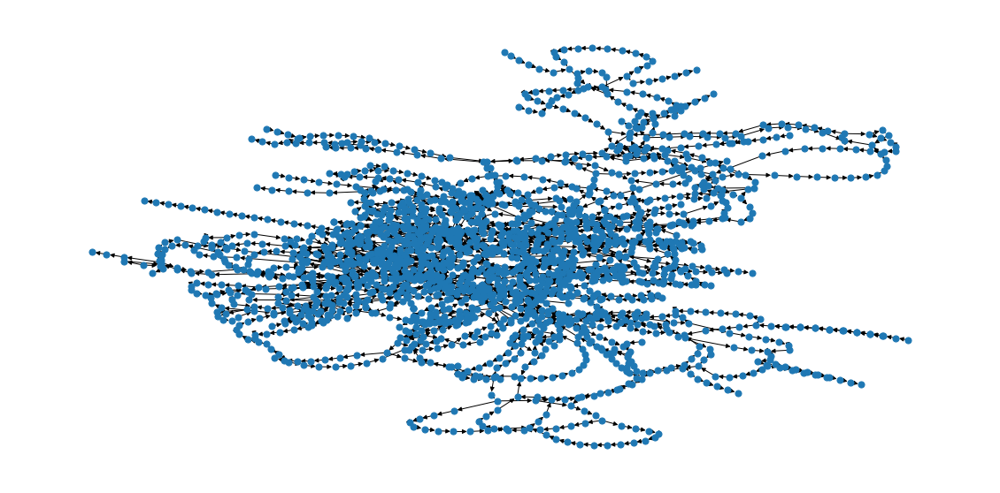

In [8]:
fig, ax = plt.subplots(figsize=(20, 10))
nx.draw_kamada_kawai(G2, node_size=50, ax=ax)

# **Analiza sieci**

***
## **Podstawowa analiza sieci**:
* rozkład stopni węzła
* rozkład najkrótszych ścieżek
* rozkład współczynnika grupowania
* średnica sieci
* liczba komponentów
* kluczowe węzły w sieci z punktu widzenia różnych miar
* do jakiego modelu sieci jest zbliżona nasza sieć (losowa, bezskalowa itd.)

#### rozkład stopni węzła

<AxesSubplot:ylabel='Count'>

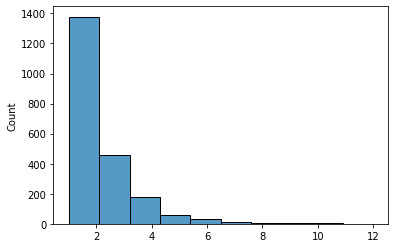

In [9]:
degrees = np.array([G2.degree(node) for node in G2.nodes])
sns.histplot(degrees, bins=10)

#### rozkład najkrótszych ścieżek

(array([2.10730e+04, 9.47010e+04, 2.70417e+05, 3.48586e+05, 4.80499e+05,
        4.43069e+05, 3.74472e+05, 2.36996e+05, 2.25582e+05, 1.61132e+05,
        1.04509e+05, 5.33120e+04, 4.06270e+04, 2.26500e+04, 1.19930e+04,
        4.97100e+03, 2.96200e+03, 1.03800e+03, 2.54000e+02, 2.90000e+01]),
 array([ 0.  ,  4.75,  9.5 , 14.25, 19.  , 23.75, 28.5 , 33.25, 38.  ,
        42.75, 47.5 , 52.25, 57.  , 61.75, 66.5 , 71.25, 76.  , 80.75,
        85.5 , 90.25, 95.  ]),
 <BarContainer object of 20 artists>)

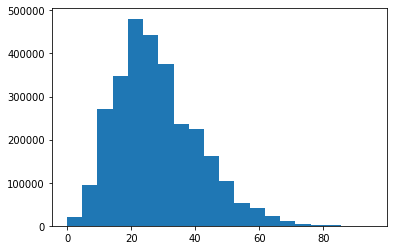

In [10]:
path_lengths = [list(x[1].values()) for x in list(nx.shortest_path_length(G2))]
path_lengths = [x for xs in path_lengths for x in xs]
plt.hist(path_lengths, bins=20)

#### rozkład współczynnika grupowania sieci

(array([1.916e+03, 2.200e+01, 2.200e+01, 4.800e+01, 1.000e+01, 5.000e+00,
        6.000e+01, 0.000e+00, 1.000e+00, 0.000e+00, 4.000e+00, 0.000e+00,
        0.000e+00, 2.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 3.200e+01]),
 array([0.   , 0.025, 0.05 , 0.075, 0.1  , 0.125, 0.15 , 0.175, 0.2  ,
        0.225, 0.25 , 0.275, 0.3  , 0.325, 0.35 , 0.375, 0.4  , 0.425,
        0.45 , 0.475, 0.5  ]),
 <BarContainer object of 20 artists>)

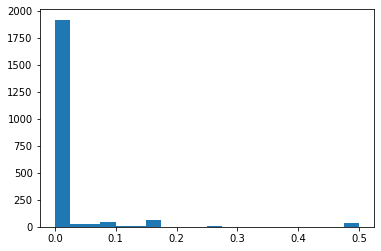

In [11]:
plt.hist(nx.clustering(G2).values(), bins=20)

#### liczba komponentów

In [12]:
print('komponenty silnie połączone:', len(list(nx.strongly_connected_components(G2))))
print('komponenty słabo połączone:', len(list(nx.weakly_connected_components(G2))))

komponenty silnie połączone: 340
komponenty słabo połączone: 2


#### kluczowe węzły w sieci z punktu widzenia różnych miar

**bliskość**

In [13]:
d = nx.closeness_centrality(G2)
sorted_closeness_centrality =  sorted(d, key=d.get, reverse=True)[:10]
pd.Series({k: round(d[k], 4) for k in sorted_closeness_centrality})

GALERIA DOMINIKAŃSKA-10111    0.0454
GALERIA DOMINIKAŃSKA-10126    0.0454
skwer Krasińskiego-20337      0.0451
PL. JANA PAWŁA II-10501       0.0448
DWORZEC AUTOBUSOWY-11321      0.0446
Katedra-20909                 0.0443
Ogród Botaniczny-20903        0.0438
Dyrekcyjna-21101              0.0438
PL. GRUNWALDZKI-20916         0.0436
Katedra-20931                 0.0434
dtype: float64

**stopień**

In [14]:
d = dict(nx.degree(G2))
sorted_degree =  sorted(d, key=d.get, reverse=True)[:10]
pd.Series({k: round(d[k], 4) for k in sorted_degree})

DWORZEC AUTOBUSOWY-21121                     12
GALERIA DOMINIKAŃSKA-10126                   10
PL. JANA PAWŁA II-10501                      10
Arkady (Capitol)-10366                        9
Hallera-11304                                 9
GALERIA DOMINIKAŃSKA-10111                    9
Psie Pole (Rondo Lotników Polskich)-29128     9
Hallera-11303                                 9
DWORZEC AUTOBUSOWY-21102                      9
KROMERA-24112                                 8
dtype: int64

**betweenness centrality**

In [15]:
d = nx.betweenness_centrality(G2)
sorted_betweenness =  sorted(d, key=d.get, reverse=True)[:10]
pd.Series({k: round(d[k], 4) for k in sorted_betweenness})

Wejherowska-12315                            0.0981
Kwiska-12318                                 0.0978
GALERIA DOMINIKAŃSKA-10126                   0.0885
Psie Pole-29103                              0.0738
Psie Pole (Rondo Lotników Polskich)-29128    0.0736
FAT-11707                                    0.0735
Wrocławski Park Technologiczny-12150         0.0735
Psie Pole-29104                              0.0702
RUBCZAKA (Stacja kolejowa)-18390             0.0649
KROMERA-24102                                0.0647
dtype: float64

#### do jakiego modelu sieci jest zbliżona nasza sieć (losowa, bezskalowa itd.)

Nasza sieć zbliżona jest do modelu bezskalowego (Barabasi-Albert)

***
## **Analiza grup w sieci**
* jakie grupy występują w naszej sieci
* ile ich jest, jak są połączone, jakiej są wielkości
* z czego może wynikać dany podział
* jak wygląda podział na grupy z punktu widzenia różnych algorytmów do ekstrakcji grup.

In [16]:
from tqdm.notebook import tqdm
from scipy.cluster import hierarchy
from scipy.spatial import distance
from collections import defaultdict

# https://notebook.community/eflegara/NetStruc/6.%20Community%20Detection
# Ravash algorithm
def agglomerative_grouping(G):
    nodes = list(G.nodes())
    path_length = nx.all_pairs_shortest_path_length(G)
    path_length = [path for path in path_length]
    # Set-up the distance matrix D
    distances = np.zeros((len(G),len(G)))   
    for u, p in tqdm(path_length, total=len(path_length)):
        for v, d in p.items():
            distances[nodes.index(u)][nodes.index(v)] = d
            distances[nodes.index(v)][nodes.index(u)] = d
            if u == v: 
                distances[nodes.index(u)][nodes.index(u)] = 0

    # Create hierarchical cluster (HC)
    # complete/max/farthest point linkage 
    Y = distance.squareform(distances) # the upper triangular of the distance matrix 
    Z = hierarchy.average(Y)        
    return Z

In [17]:
graph = nx.Graph(G2)
pos = nx.fruchterman_reingold_layout(graph)

Z = agglomerative_grouping(graph) 

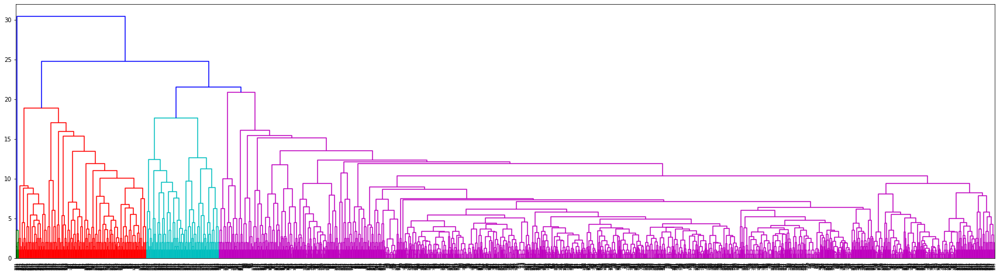

In [347]:
plt.figure(figsize=(30,8))
hierarchy.dendrogram(Z)
plt.show()

#### jakie grupy występują w naszej sieci

Grupami w sieci są przystanki należące do tej samej trasy komunikacji miejskiej. Widać zjawisko dołączania przystanków do jednego większego klastra (im przystanek bliżej centrum tym większe prawdopodobieństwo dołączenia do tego klastra)

#### ile ich jest, jak są połączone, jakiej są wielkości

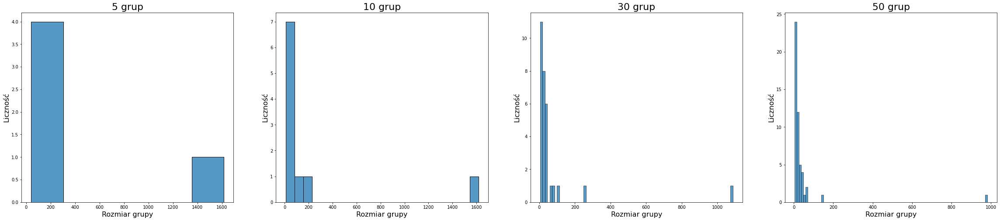

In [22]:
# Unikatowe grupy i ich liczności
fig, axes = plt.subplots(1, 4, figsize=(40, 8))
for ax, n_groups in zip(axes, [5, 10, 30, 50]):
    groups = hierarchy.fcluster(Z, criterion='maxclust', t=n_groups)
    unique, counts = np.unique(groups, return_counts=True)

    # Ilość grup w sieci
    n_groups = len(unique)

    # Histogram liczności grup w sieci
    sns.histplot(counts, ax=ax)
    ax.set_title(f"{n_groups} grup", fontsize=22)
    ax.set_xlabel("Rozmiar grupy", fontsize=16)
    ax.set_ylabel("Liczność", fontsize=16)

#### z czego może wynikać dany podział

* Grupy na obrzeżach - niektóre linie jeżdżą tylko na małych obszarach
* Jedna grupa w centrum - przystanki w centrum "obsługują" wiele linii 

#### jak wygląda podział na grupy z punktu widzenia różnych algorytmów do ekstrakcji grup.

In [349]:
# Algorytm Girvan-Newman

from networkx.algorithms.community.centrality import girvan_newman

G = graph
communities = girvan_newman(G)
communities = [c for c in communities]

In [357]:
def plot_communities(G, groups):    
    palette = sns.color_palette('tab10', len(groups))
    node_groups = []
    for group in groups:  
        node_groups.append(list(group))
        
    color_map = []
    for node in G:
        for i, node_group in enumerate(node_groups):
            if node in node_group:        
                color_map.append(sns.color_palette('tab10')[i])    

    plt.figure(figsize=(30, 20))
    nx.draw(G, node_color=color_map, with_labels=False, pos=pos_kamada_kawai)
    plt.show()

***

## **Analiza wizualna sieci**
* różne layouty
* różne sposoby kolorowania, kształtu, wielkości wierzchołków 
    * w zależności od wartości poszczególnych miar
    * w zależności od podziału na grupy
* wizualizacja tylko wycinka sieci (np. jednej grupy) itd.

#### różne layouty

In [1]:
pos_kamada_kawai = nx.kamada_kawai_layout(graph)
pos_fruchterman_reingold = nx.fruchterman_reingold_layout(graph)
pos_circular = nx.circular_layout(graph)

layouts = {
    "kamada_kawai": pos_kamada_kawai,
    'fruchterman_reingold': pos_fruchterman_reingold,
    'circular': pos_circular,
}

for name, pos in layouts.items():
    plt.figure(figsize=(30, 20))
    nx.draw(graph, pos=pos, with_labels=False)
    plt.axis('off')
    plt.title(f"{name}", fontsize=22)
    plt.show()

#### różne sposoby kolorowania, kształtu, wielkości wierzchołków

##### w zależności od wartości poszczególnych miar

1. PageRank

In [2]:
pr = nx.pagerank(graph, alpha=0.9)

fig, ax = plt.subplots(figsize=(30, 15))
nx.draw(graph, pos=pos_kamada_kawai, node_size=np.array(list(pr.values()))*3e5, ax=ax, alpha=0.85)

2. Stopień węzła

In [6]:
degrees = np.array([graph.degree(node) for node in graph.nodes])

fig, ax = plt.subplots(figsize=(30, 15))
nx.draw(graph, pos=pos_kamada_kawai, node_size=degrees*50, ax=ax, alpha=0.85)

3. Betweenness

In [3]:
betweenness = nx.betweenness_centrality(graph)

fig, ax = plt.subplots(figsize=(30, 15))
nx.draw(graph, pos=pos_kamada_kawai, node_size=np.array(list(betweenness.values()))*2e4, ax=ax, alpha=0.85)

##### w zależności od podziału na grupy (powyżej już jest)

In [7]:
# Grupy w sieci
for n_groups in [5, 10, 30, 50]:
    groups = hierarchy.fcluster(Z, criterion='maxclust', t=n_groups)
    palette = sns.color_palette("hls", n_groups)
    color_map = [palette[i-1] for i in groups]
    plt.figure(figsize=(30, 20))
    nx.draw(graph, pos=pos_circular, node_color=color_map, with_labels=False)
    plt.axis('off')
    plt.title(f"n_groups = {n_groups}", fontsize=22)
    plt.show()

#### wizualizacja tylko wycinka sieci (np. jednej grupy) itd.

In [31]:
groups = hierarchy.fcluster(Z, criterion='maxclust', t=100)

unique, counts = np.unique(groups, return_counts=True)
biggest_group = unique[counts.argmax()]

mask = groups == biggest_group
masked_nodes = np.array(graph.nodes)[mask]
print(f"Biggest group from grapg ({len(masked_nodes)} nodes)")
group_graph = graph.subgraph(masked_nodes)  

Biggest group from grapg (473 nodes)


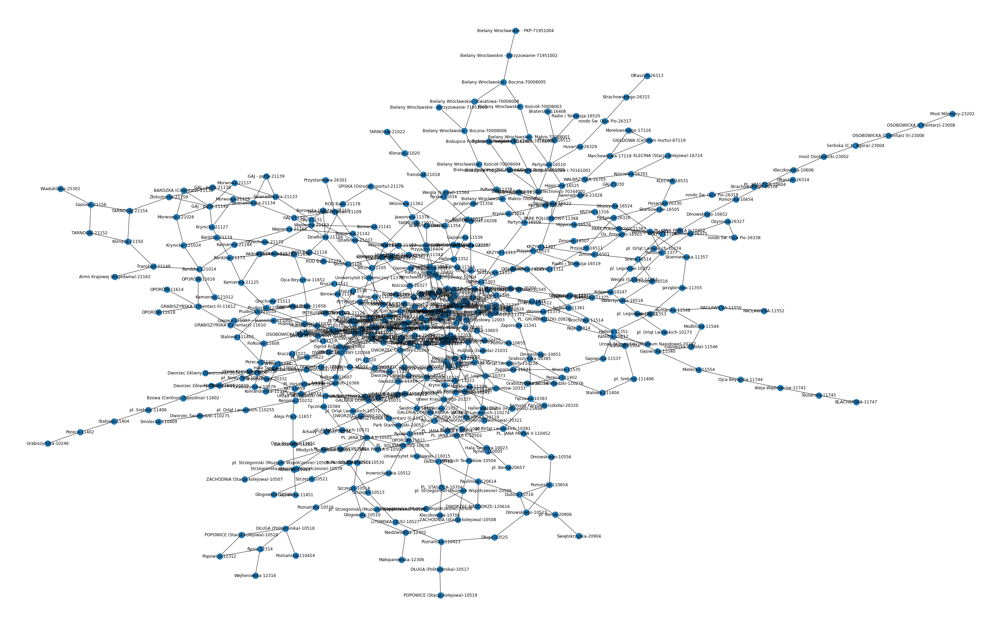

In [32]:
plt.figure(figsize=(40, 25))
pos_kamada_kawai_2 = nx.kamada_kawai_layout(group_graph)
nx.draw(group_graph, pos=pos_kamada_kawai_2, with_labels=True)

## **Analiza rozprzestrzeniania w sieci**
* jak rozprzestrzenia się informacja
* wpływ wirusa w Waszej sieci w zależności od różnych warunków np. 
    * jak wygląda proces gdy zaczniemy od wierzchołka X, Y, Z
    * jak wygląda proces gdy „zaszczepimy” węzły A, B, C
    * kogo musimy, zaszczepić/odizolować by w przypadku wybuchu epidemii w jednej grupie społecznej nie przedostała się ona do innych
    * co jeżeli mamy ograniczoną liczbę szczepionek albo szczepionki przychodzą partiami i danego dnia możemy zaszczepić ograniczoną liczbę osób itp.

#### jak rozprzestrzenia się informacja

In [133]:
import random

def icm(G, steps=10, p=0.5, seed=[], immune=[]):
    active = [seed]
    # activated = [len(active)]

    for step in range(steps):
        new_active = []
        for edge in G.edges(active[-1]):
            if edge[1] not in active[-1] and edge[1] not in new_active and edge[1] not in immune and random.random() < p / G.degree(edge[1]):
                new_active.append(edge[1])
        # activated.append(len(new_active))
        active.append([a for a in active[-1]] + new_active)
    
    return active

def avg_results(results):
    len_results = [[len(x2) for x2 in x1] for x1 in results]
    return np.array(len_results).mean(axis=0)

In [143]:
from matplotlib import animation
from random import choice
import os.path

def show_propagation(G: nx.Graph, active, prefix: str, overwrite=False):
    active2 = np.zeros((len(active), G.number_of_nodes()), dtype=int)
    nodes = list(G.nodes)
    for i in range(G.number_of_nodes()):
        for epoch in range(len(active)):
            if nodes[i] in active[epoch]:
                active2[epoch][i] = 1
    palette = sns.color_palette('tab10', 2)
    color_map = []
    for epoch in active2:
        color_map.append([palette[i] for i in epoch])
    
    for i in range(len(color_map)):
        if not os.path.exists(prefix + '_' + str(i) + '.png') or overwrite:
            fig, _ = plt.subplots(figsize=(40,40))
            nx.draw_kamada_kawai(G, node_color=color_map[i], with_labels=False, fig=fig)
            plt.savefig(prefix + '_' + str(i) + '.png')
        
    images = [plt.imread(prefix + '_' + str(i) + '.png') for i in range(len(color_map))]
    layout = nx.kamada_kawai_layout(G2)
    
    fig, ax = plt.subplots(figsize=(40,40))
    def animate(i):
        return plt.imshow(images[i], fig=fig)
    
    def simple_update(num, layout, G, ax):
        ax.clear()

        # Draw the graph with random node colors
        # random_colors = np.random.randint(2, size=n)
        nx.draw(G, pos=layout, node_color=color_map[num], ax=ax)

        # Set the title
        ax.set_title("Frame {}".format(num))

    # nx.draw_kamada_kawai(G2, fig=fig)
    return animation.FuncAnimation(fig, simple_update, frames=len(active), fargs=(layout, G, ax))

def show_propagated(G, active, immune=[]):
    palette = sns.color_palette('tab10', 3)
    color_map = [palette[i] for i in [int(x in active[-1]) for x in list(G2.nodes)]]
    nodes = list(G.nodes)
    for i in range(len(nodes)):
        if nodes[i] in immune:
            color_map[i] = palette[2]
    fig, _ = plt.subplots(figsize=(40,40))
    nx.draw_kamada_kawai(G, node_color=color_map, with_labels=False, fig=fig)


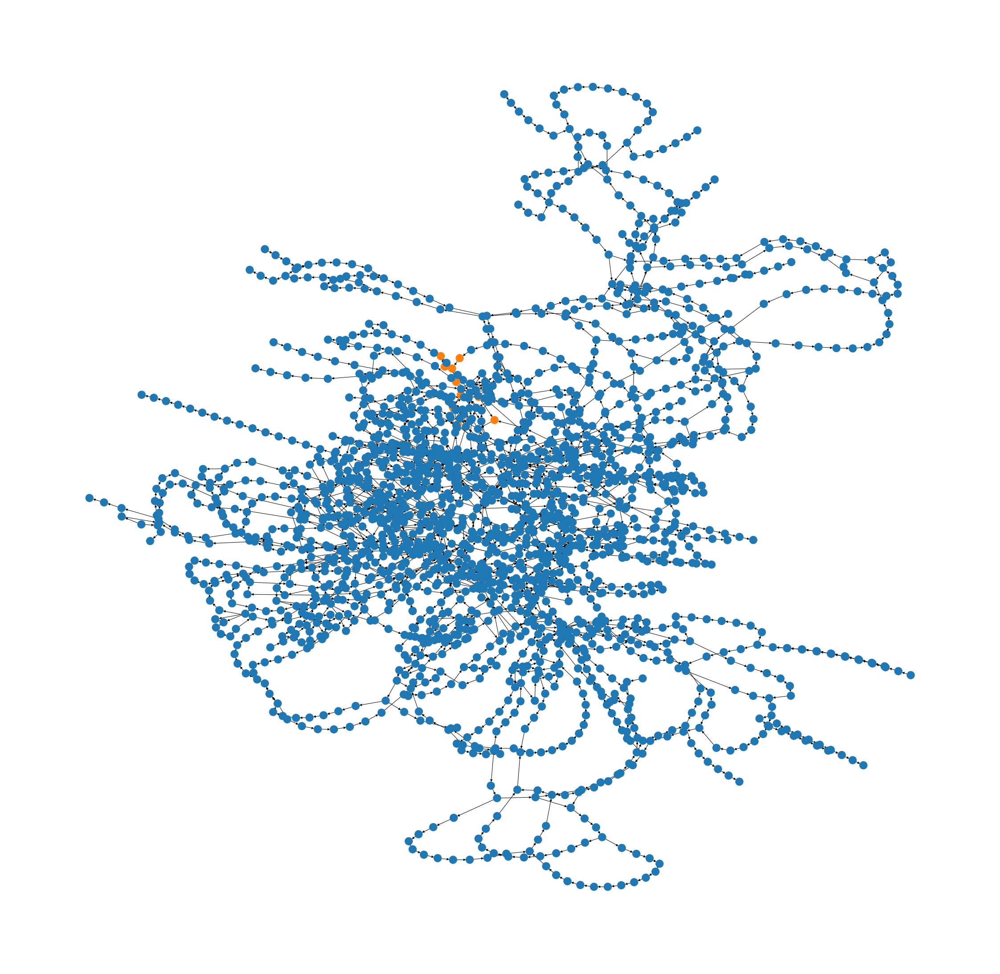

In [138]:
active = icm(G2, seed=[choice(list(G2.nodes))], steps=20)
show_propagated(G2, active)

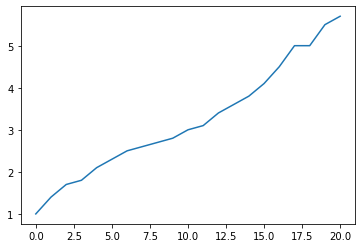

In [139]:
active = [icm(G2, seed=[choice(list(G2.nodes))], steps=20) for _ in range(10)]
results = avg_results(active)
plt.plot(results)

#### wpływ wirusa w Waszej sieci w zależności od różnych warunków

zwiększone prawdopodobieństwo

p = 1

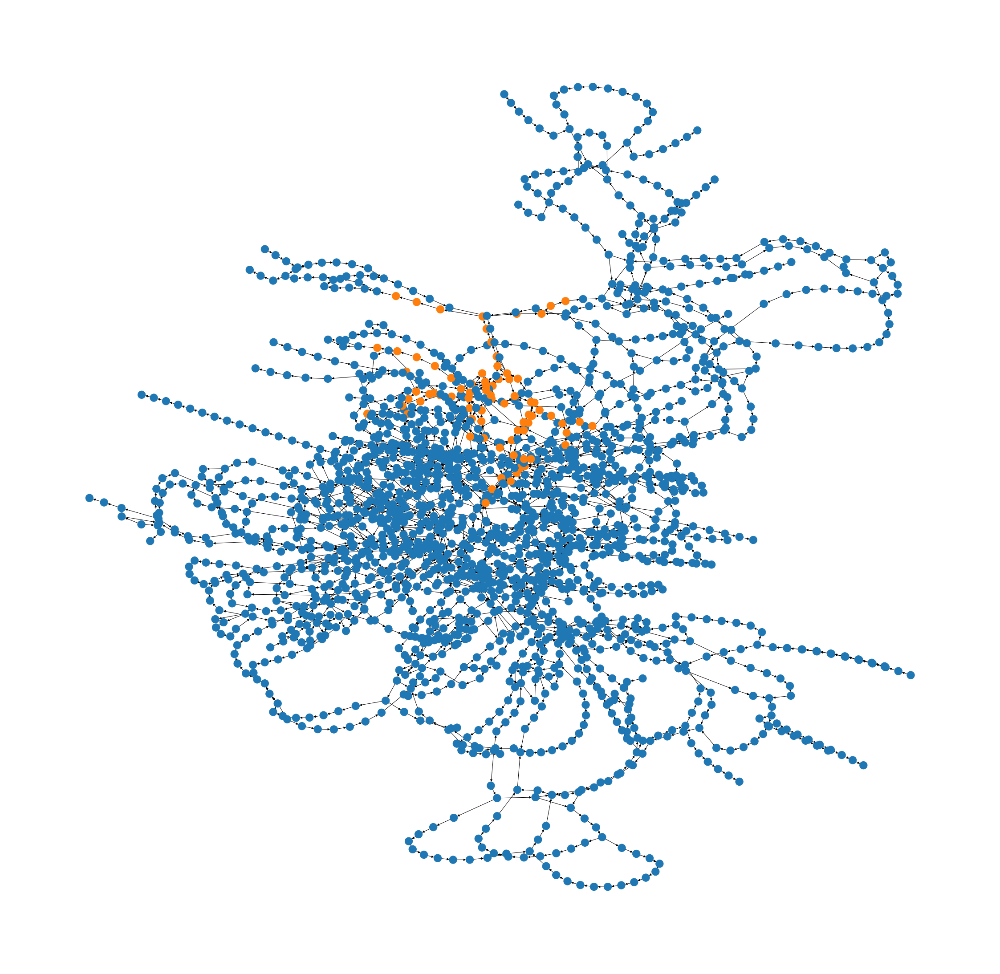

In [140]:
active = icm(G2, seed=[choice(list(G2.nodes))], steps=20, p=1.0)
show_propagated(G2, active)

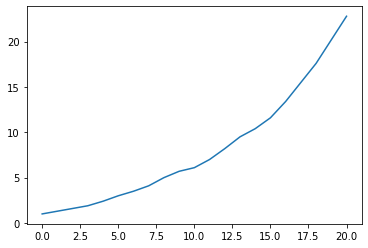

In [121]:
active = [icm(G2, seed=[choice(list(G2.nodes))], steps=20, p=1.) for _ in range(10)]
results = avg_results(active)
plt.plot(results)

5 początkowych wierzchołków

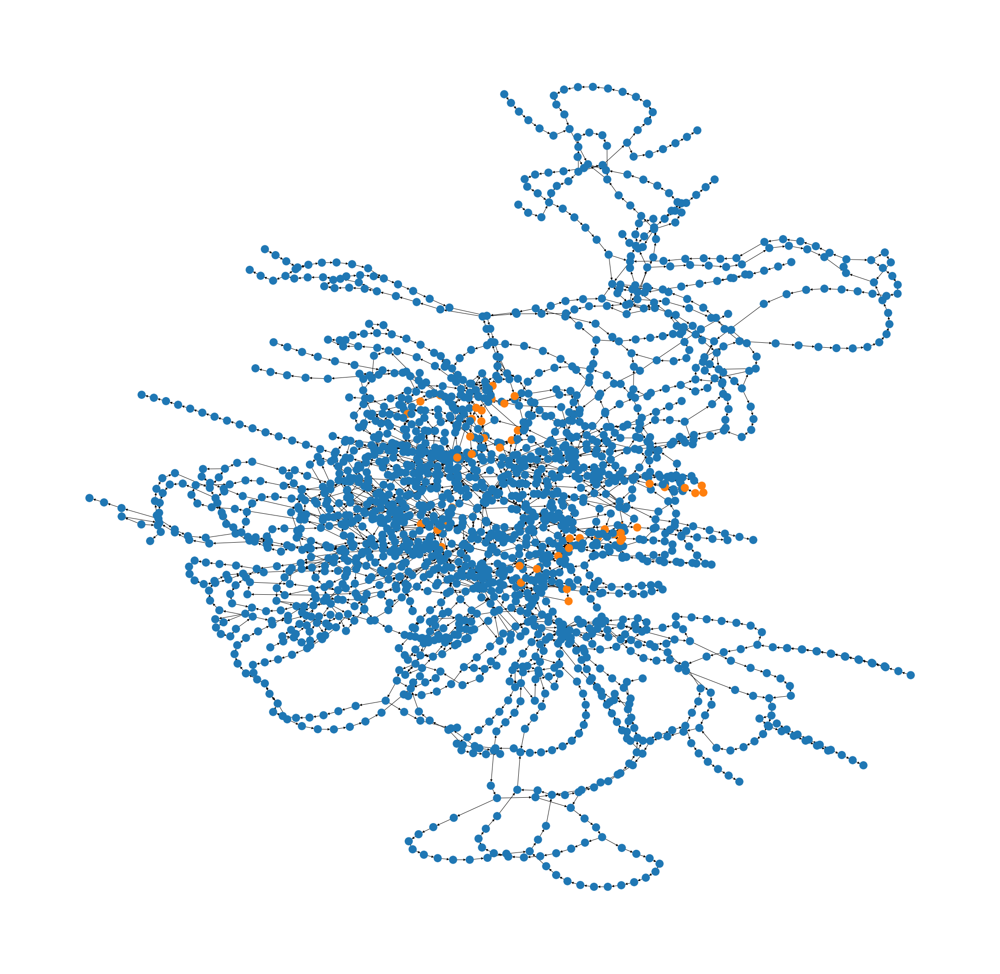

In [126]:
from random import choices
active = icm(G2, seed=choices(list(G2.nodes), k=5), steps=20)
show_propagated(G2, active)

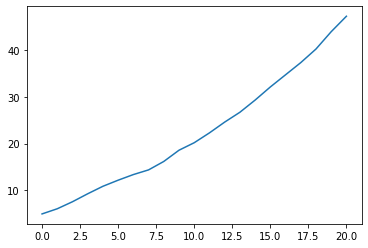

In [127]:
active = [icm(G2, seed=choices(list(G2.nodes), k=5), steps=20) for _ in range(10)]
results = avg_results(active)
plt.plot(results)

##### jak wygląda proces gdy zaczniemy od wierzchołka X, Y, Z

closeness

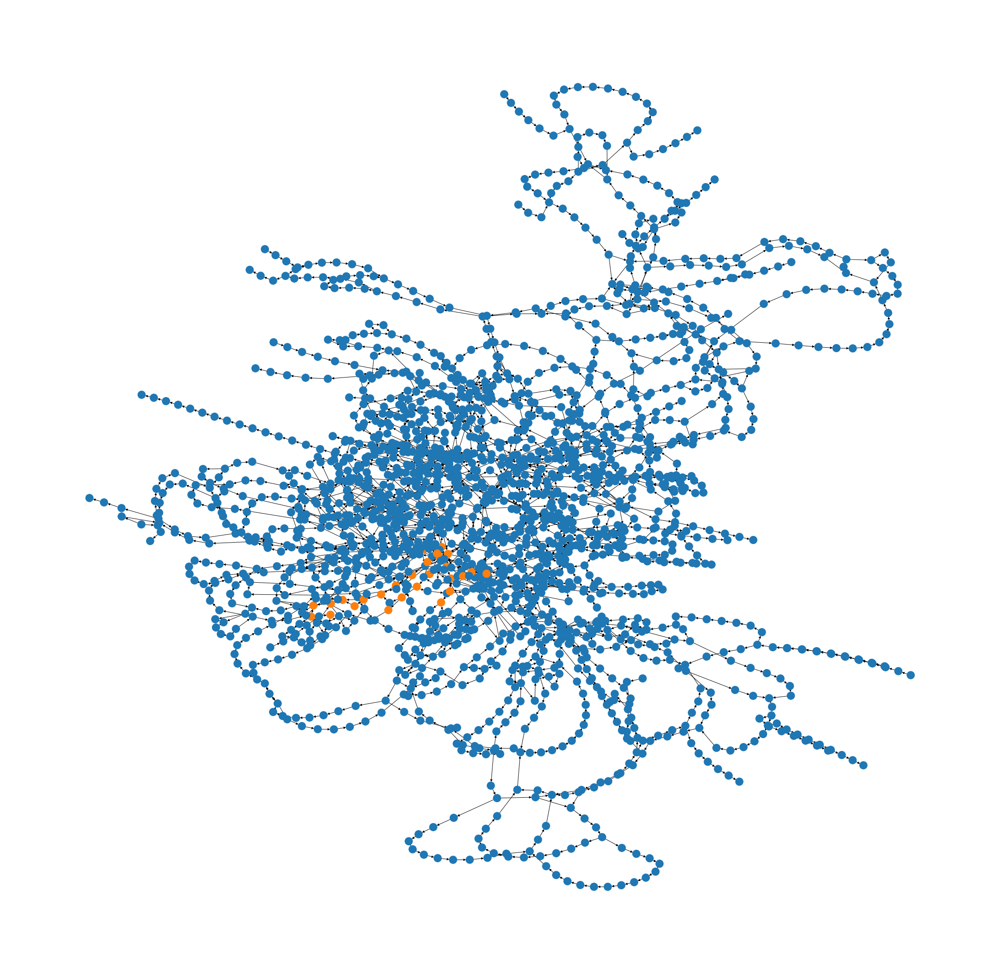

In [122]:
d = nx.closeness_centrality(G2)
seed = sorted(d, key=d.get, reverse=True)[:1]
active = icm(G2, seed=seed, steps=20)
show_propagated(G2, active)

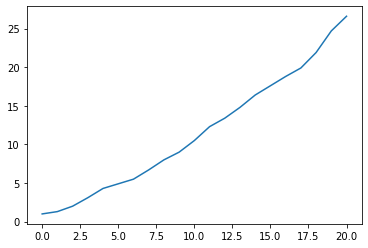

In [123]:
active = [icm(G2, seed=seed, steps=20) for _ in range(10)]
results = avg_results(active)
plt.plot(results)

degree

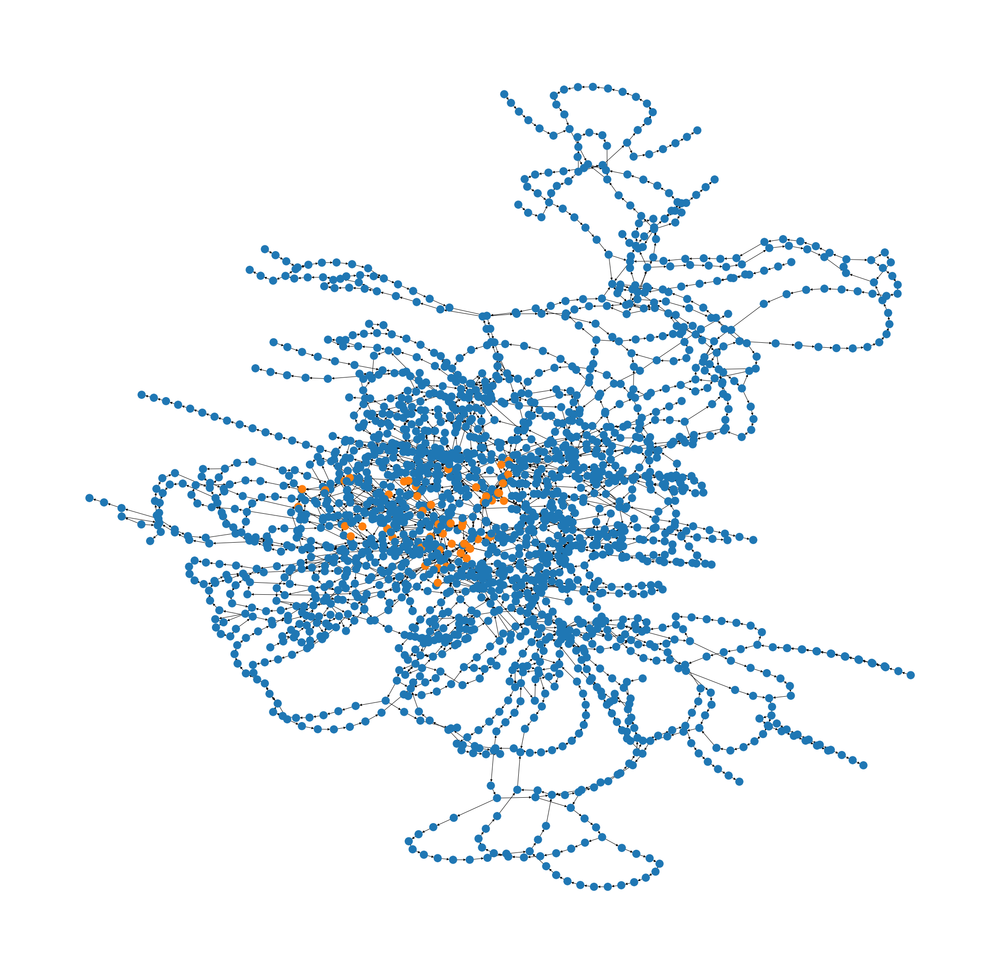

In [128]:
d = dict(nx.degree(G2))
seed = sorted(d, key=d.get, reverse=True)[:1]
active = icm(G2, seed=seed, steps=20)
show_propagated(G2, active)

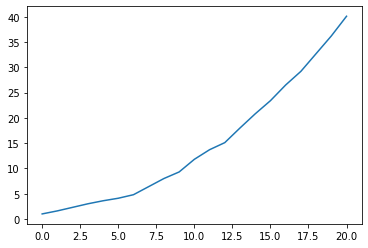

In [129]:
active = [icm(G2, seed=seed, steps=20) for _ in range(10)]
results = avg_results(active)
plt.plot(results)

betweenness

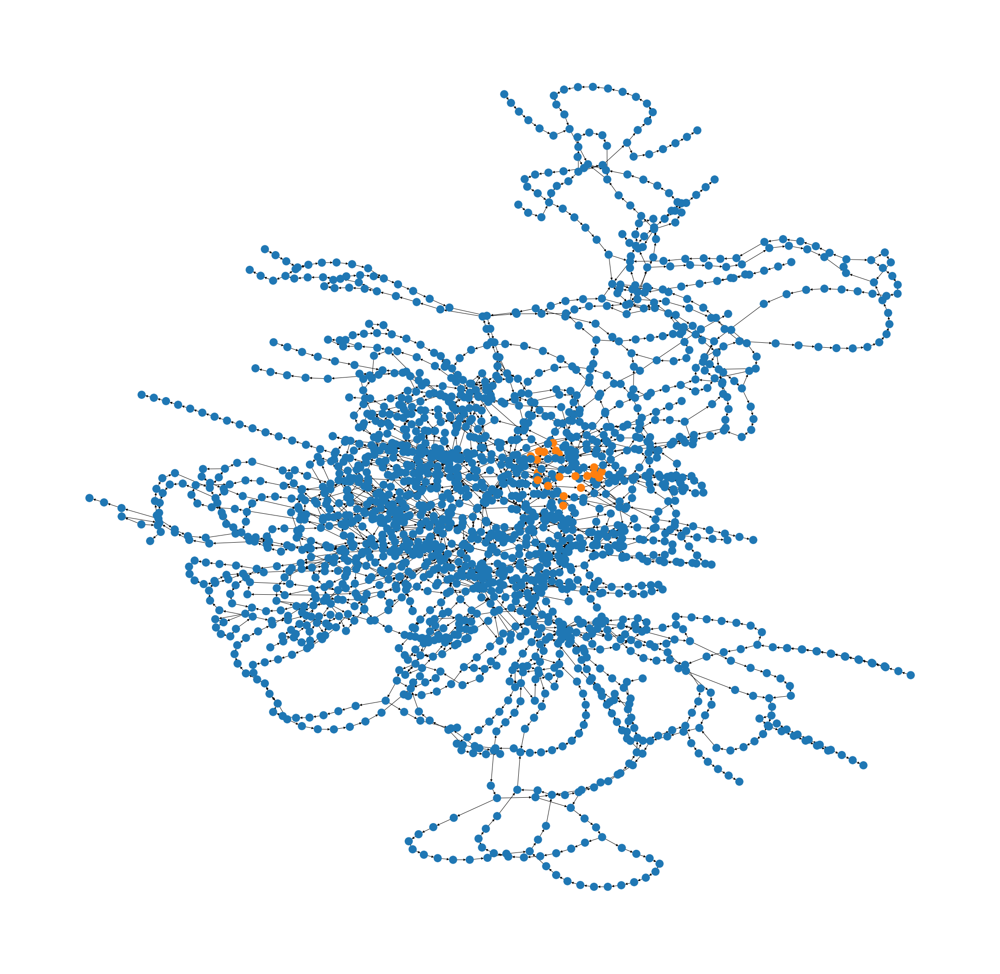

In [130]:
d = nx.betweenness_centrality(G2)
seed = sorted(d, key=d.get, reverse=True)[:1]
active = icm(G2, seed=seed, steps=20)
show_propagated(G2, active)

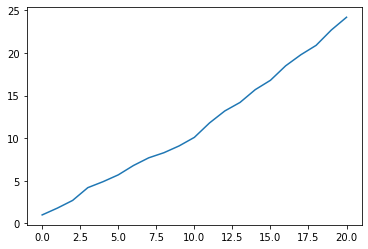

In [131]:
active = [icm(G2, seed=seed, steps=20) for _ in range(10)]
results = avg_results(active)
plt.plot(results)

##### jak wygląda proces gdy „zaszczepimy” węzły A, B, C

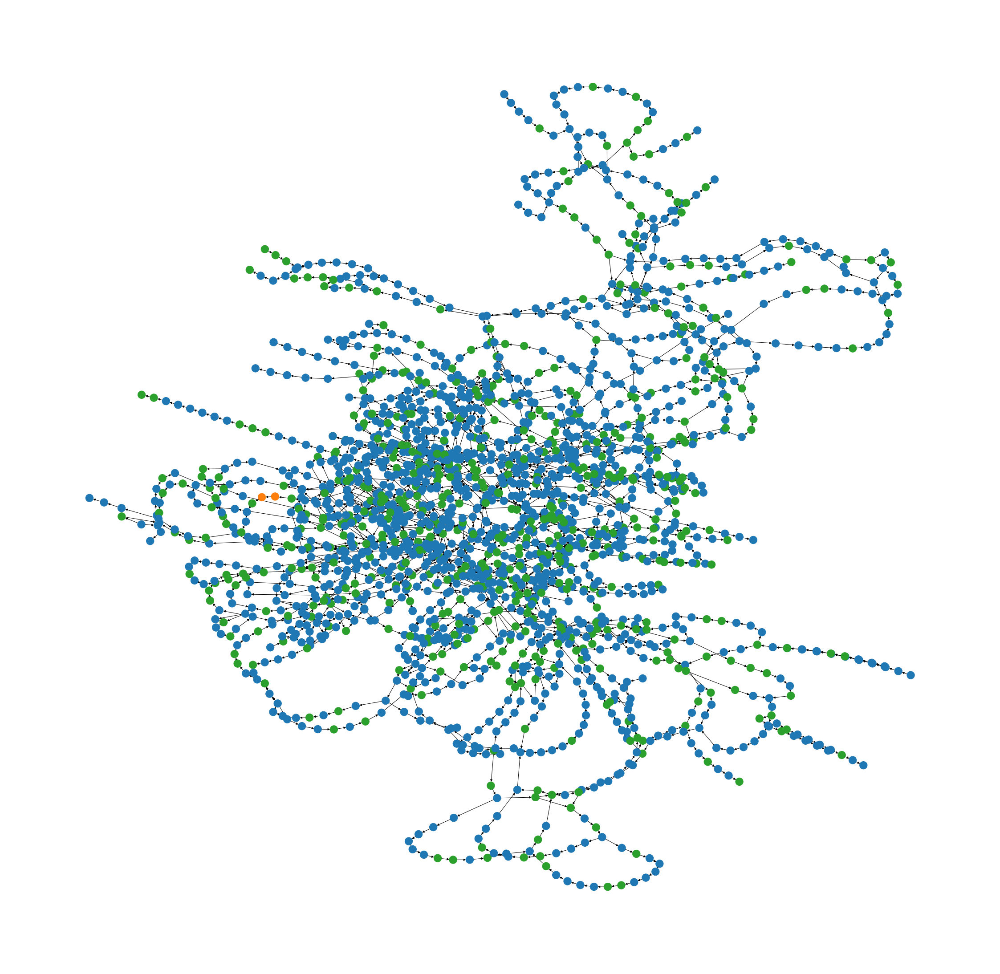

In [145]:
immune = choices(list(G2.nodes), k=G2.number_of_nodes()//3)
active = icm(G2, seed=[choice(list(G2.nodes))], steps=20, immune=immune)
show_propagated(G2, active, immune)

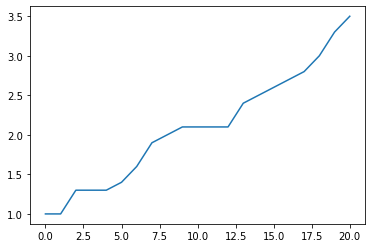

In [146]:
active = [icm(G2, seed=[choice(list(G2.nodes))], steps=20, immune=choices(list(G2.nodes), k=G2.number_of_nodes()//3)) for _ in range(10)]
results = avg_results(active)
plt.plot(results)

##### kogo musimy, zaszczepić/odizolować by w przypadku wybuchu epidemii w jednej grupie społecznej nie przedostała się ona do innych

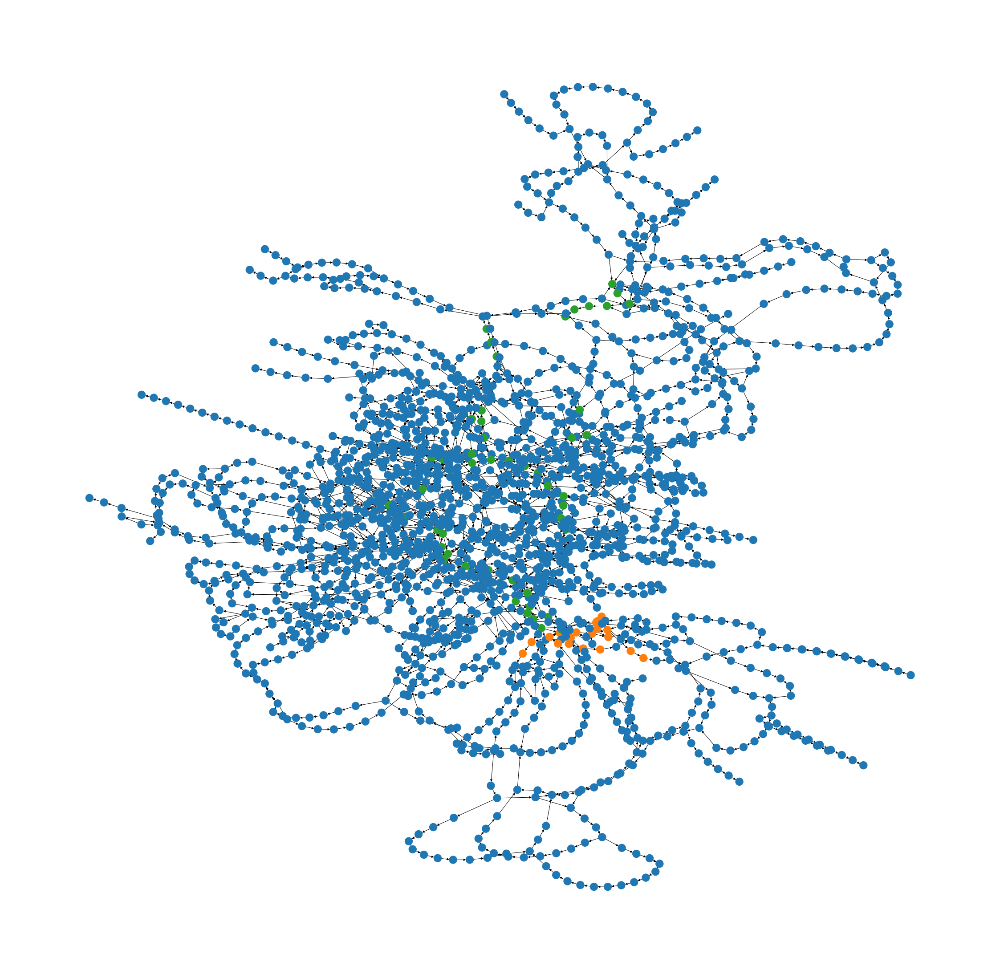

In [149]:
d = nx.betweenness_centrality(G2)
immune = sorted(d, key=d.get, reverse=True)[:50]
active = icm(G2, seed=[choice(list(G2.nodes))], steps=20, immune=immune, p=1.)
show_propagated(G2, active, immune)

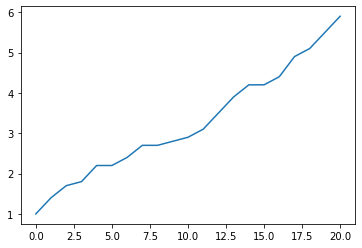

In [148]:
active = [icm(G2, seed=[choice(list(G2.nodes))], steps=20, immune=immune) for _ in range(10)]
results = avg_results(active)
plt.plot(results)

##### co jeżeli mamy ograniczoną liczbę szczepionek albo szczepionki przychodzą partiami i danego dnia możemy zaszczepić ograniczoną liczbę osób itp.